# Introduction

# Analysis preparation

## Import packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import time

In [2]:
from data_quality_stats import missing_data, most_frequent_values, unique_values

## Read the data

In [3]:
pub_df = pd.read_csv("/kaggle/input/every-pub-in-england/open_pubs.csv")

# Check data

In [4]:
pub_df.shape

(51566, 9)

In [5]:
pub_df.head()

,fas_id,name,address,postcode,easting,northing,latitude,longitude,local_authority
0,24,Anchor Inn,"Upper Street, Stratford St Mary, COLCHESTER, E...",CO7 6LW,604748,234405.0,51.97039,0.979328,Babergh
1,30,Angel Inn,"Egremont Street, Glemsford, SUDBURY, Suffolk",CO10 7SA,582888,247368.0,52.094427,0.668408,Babergh
2,63,Black Boy Hotel,"7 Market Hill, SUDBURY, Suffolk",CO10 2EA,587356,241327.0,52.038683,0.730226,Babergh
3,64,Black Horse,"Lower Street, Stratford St Mary, COLCHESTER, E...",CO7 6JS,604270,233920.0,51.966211,0.972091,Babergh
4,65,Black Lion,"Lion Road, Glemsford, SUDBURY, Suffolk",CO10 7RF,582750,248298.0,52.102815,0.666893,Babergh


In [6]:
pub_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51566 entries, 0 to 51565
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   fas_id           51566 non-null  int64  
 1   name             51566 non-null  object 
 2   address          51566 non-null  object 
 3   postcode         51566 non-null  object 
 4   easting          51566 non-null  int64  
 5   northing         51566 non-null  float64
 6   latitude         51566 non-null  object 
 7   longitude        51566 non-null  object 
 8   local_authority  51564 non-null  object 
dtypes: float64(1), int64(2), object(6)
memory usage: 3.5+ MB


In [7]:
pub_df.describe()

,fas_id,easting,northing
count,51566.000000,51566.000000,5.156600e+04
mean,257639.559884,425990.079083,3.071099e+05
std,146746.592270,97946.049466,2.721550e+05
min,24.000000,78110.000000,-5.527598e+06
25%,141059.250000,358294.250000,1.804910e+05
50%,261943.500000,425932.000000,2.901270e+05
75%,377987.500000,506401.500000,4.108578e+05
max,514817.000000,655277.000000,1.030836e+06


In [8]:
missing_data(pub_df)

,fas_id,name,address,postcode,easting,northing,latitude,longitude,local_authority
Total,0,0,0,0,0,0,0,0,2
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003879
Types,int64,object,object,object,int64,float64,object,object,object


In [9]:
most_frequent_values(pub_df)

,fas_id,name,address,postcode,easting,northing,latitude,longitude,local_authority
Total,51566,51566,51566,51566,51566,51566,51566,51566,51564
Most frequent item,24,The Red Lion,"Lancaster University, Bailrigg Lane, Lancaster...",L2 6RE,622675,-5527598.0,\N,\N,County Durham
Frequence,1,193,8,10,70,70,70,70,679
Percent from total,0.002,0.374,0.016,0.019,0.136,0.136,0.136,0.136,1.317


In [10]:
unique_values(pub_df)

,fas_id,name,address,postcode,easting,northing,latitude,longitude,local_authority
Total,51566,51566,51566,51566,51566,51566,51566,51566,51564
Uniques,51566,35636,50162,46625,43172,43945,46655,46735,376


## Perform detailed data quality analysis

We will need to check carefully the rows having 'local_authority' null as well as the items that shows \N for lat/long.   

We will also attempt to fix issues with the data quality.

Let's start with the rows with 'local_authority' null.

In [11]:
pub_df.loc[pub_df.local_authority.isna()].head()

,fas_id,name,address,postcode,easting,northing,latitude,longitude,local_authority
768,7499,"J D Wetherspoon \""The Star\"",""105 High Street,...",EN11 8TN,537293,208856,51.761556,-0.012036,Broxbourne,NaN
43212,412676,"\""Rory's Bar\"",""57 Market Place, Malton, North...",YO17 7LX,478582,471715,54.135281,-0.798783,Ryedale,NaN


What happens here is that the separator in the csv file got mixed-up with the quotation marks used in these two pub names.  
Let's fix these two cases.  
One possibility is to do it manualy, by splitting the name and address in the corrupted pub name and then shifting one column each of the misplaced columns.
Another one is to test with more flexible separators or to read the data line by line and implement our custom line parser. 

We will opt for the first solution here, since we only have two lines corrupted.

In [12]:
columns = ['local_authority', 'longitude', 'latitude', 'northing', 'easting', 'postcode', 'address']
# use the rows indexes to locate the rows
for index in [768, 43212]:

    for idx in range(len(columns) - 1):
        # we use `at` to make sure the changes are done on the actual dataframe, not on a copy of it
        pub_df.at[index, columns[idx]] = pub_df.loc[index][columns[idx + 1]]
    
    # split the corrupted name and assign the name and address
    name_and_addresse = pub_df.loc[index]['name'].split("\",\"")
    pub_df.at[index, 'name'] = name_and_addresse[0]
    pub_df.at[index, 'address'] = name_and_addresse[1]

Let's check again these two rows.

In [13]:
pub_df.loc[pub_df.index.isin([768, 43212])].head()

,fas_id,name,address,postcode,easting,northing,latitude,longitude,local_authority
768,7499,"J D Wetherspoon \""The Star\","105 High Street, Hoddesdon, Hertfordshire",EN11 8TN,537293,208856.0,51.761556,-0.012036,Broxbourne
43212,412676,"\""Rory's Bar\","57 Market Place, Malton, North Yorkshire",YO17 7LX,478582,471715.0,54.135281,-0.798783,Ryedale


Let's check now the items with "\\N" for lat/long.

In [14]:
pub_df.loc[pub_df.latitude=="\\N"].head()

,fas_id,name,address,postcode,easting,northing,latitude,longitude,local_authority
516,5501,The Greenstone,"Napier Way, Dereham, Norfolk",NR19 1FS,622675,-5527598.0,\N,\N,Breckland
915,9360,Oyster Bay Sports & Wine Bar,"Unit 4, Casino Parade, Eastern Esplanade, Canv...",SS8 7FJ,622675,-5527598.0,\N,\N,Castle Point
2435,22968,The Mermaid Public House,"Yarmouth Road, Ipswich, Suffolk",IP1 2EN,622675,-5527598.0,\N,\N,Ipswich
2575,24359,The Gatehouse,"Kellard Place, King's Lynn, Norfolk",PE30 5DG,622675,-5527598.0,\N,\N,King's Lynn and West Norfolk
3271,30970,The Shoe Maker,"1 The Lastings, Sandy Lane, Norwich",NR4 6EF,622675,-5527598.0,\N,\N,Norwich


In [15]:
pub_df.loc[pub_df.longitude=="\\N"].head(2)

,fas_id,name,address,postcode,easting,northing,latitude,longitude,local_authority
516,5501,The Greenstone,"Napier Way, Dereham, Norfolk",NR19 1FS,622675,-5527598.0,\N,\N,Breckland
915,9360,Oyster Bay Sports & Wine Bar,"Unit 4, Casino Parade, Eastern Esplanade, Canv...",SS8 7FJ,622675,-5527598.0,\N,\N,Castle Point


In [16]:
pub_df.loc[pub_df.longitude=="\\N"].shape, pub_df.loc[pub_df.latitude=="\\N"].shape,\
pub_df.loc[(pub_df.longitude=="\\N") & (pub_df.latitude=="\\N")].shape

((70, 9), (70, 9), (70, 9))

There are 70 cases where both latitude and longitude are missing. Let's check the values of easting and northing for these rows.

In [17]:
pub_df.loc[(pub_df.longitude=="\\N") & (pub_df.latitude=="\\N"), "easting"].unique(),\
pub_df.loc[(pub_df.longitude=="\\N") & (pub_df.latitude=="\\N"), "northing"].unique()

(array([622675]), array([-5527598.]))

All these 70 pubs apparently have missing lat/long and same easting and northing values.   

We can check and fix the lat/long using the assigned northing and easting. Since they have the same value for northing and easting, it might be that this is not the correct one. Let's make sure this by looking to the other informations: local authority and postal code.

Let's also check the local authorities and postcodes for those cases.

In [18]:
pub_df.loc[(pub_df.longitude=="\\N") & (pub_df.latitude=="\\N"), "local_authority"].unique()

array(['Breckland', 'Castle Point', 'Ipswich',
       "King's Lynn and West Norfolk", 'Norwich', 'Southend-on-Sea',
       'Charnwood', 'Chesterfield', 'Derbyshire Dales', 'Nottingham',
       'Rutland', 'South Kesteven', 'South Northamptonshire', 'Croydon',
       'Enfield', 'Hammersmith and Fulham', 'Kingston upon Thames',
       'Richmond upon Thames', 'Southwark', 'Westminster', 'Darlington',
       'County Durham', 'Hartlepool', 'Middlesbrough',
       'Newcastle upon Tyne', 'Northumberland', 'South Tyneside',
       'Chorley', 'Liverpool', 'Rochdale', 'Trafford', 'Wigan',
       'Aylesbury Vale', 'Hastings', 'Southampton', 'Test Valley',
       'Tonbridge and Malling', 'Wealden', 'Worthing', 'Wycombe',
       'Exeter', 'Mendip', 'North Somerset', 'Wiltshire', 'Birmingham',
       'Cannock Chase', 'Solihull', 'Barnsley', 'Bradford', 'Doncaster',
       'East Riding of Yorkshire', 'Kirklees', 'North East Lincolnshire',
       'Wakefield', 'City of Edinburgh', 'Renfrewshire', 'Newpo

In [19]:
postcode_with_none_lat_long = pub_df.loc[(pub_df.longitude=="\\N") & (pub_df.latitude=="\\N"), "postcode"].unique()

In [20]:
postcode_with_none_lat_long

array(['NR19 1FS', 'SS8 7FJ', 'IP1 2EN', 'PE30 5DG', 'NR4 6EF', 'SS1 1FP',
       'SS2 6QN', 'LE12 7WL', 'S44 5FD', 'DE4 2NZ', 'DE6 3HA', 'NG2 4PL',
       'LE15 7US', 'PE9 1US', 'PE10 0ET', 'NN7 1NJ', 'CR0 1SL', 'EN2 6LL',
       'W6 9GD', 'KT1 1PX', 'TW11 0EL', 'SE1 3ST', 'SW1E 6AN', 'DL1 5AD',
       'NE16 6ED', 'DH8 7BF', 'TS25 1SD', 'TS3 6AT', 'NE1 3NP',
       'NE61 6BL', 'NE31 1ST', 'PR7 7JD', 'L1 4AX', 'OL16 4PS',
       'WA14 4FB', 'WN2 3DN', 'MK18 2GJ', 'TN35 4BW', 'SO16 3UD',
       'SP11 8BF', 'SO16 0AU', 'ME16 0ZP', 'TN6 2XZ', 'BN14 9FL',
       'HP11 1SQ', 'EX4 8GA', 'BA6 9GY', 'BS20 7QZ', 'BS24 8EE',
       'BS24 7JP', 'SN12 6AD', 'SN12 7GS', 'B19 2XU', 'B31 2US',
       'WS12 1DU', 'B90 3GG', 'S70 5SZ', 'BD16 1GH', 'DN2 4BG',
       'HU12 0JN', 'BD11 2DP', 'DN37 9UA', 'WF1 5RT', 'EH1 1HJ',
       'PA3 3FE', 'NP19 4TZ', 'SA5 4BE'], dtype=object)

In [21]:
pub_df.loc[(pub_df.longitude=="\\N"), 'longitude'] = None
pub_df.loc[(pub_df.latitude=="\\N"), 'latitude'] = None


In [22]:
postcode_with_none_lat_long = pub_df.loc[(pub_df.longitude.isna()) & (pub_df.latitude.isna()), "postcode"].unique()

In [23]:
selected_postcodes = postcode_with_none_lat_long
selected_postcodes

array(['NR19 1FS', 'SS8 7FJ', 'IP1 2EN', 'PE30 5DG', 'NR4 6EF', 'SS1 1FP',
       'SS2 6QN', 'LE12 7WL', 'S44 5FD', 'DE4 2NZ', 'DE6 3HA', 'NG2 4PL',
       'LE15 7US', 'PE9 1US', 'PE10 0ET', 'NN7 1NJ', 'CR0 1SL', 'EN2 6LL',
       'W6 9GD', 'KT1 1PX', 'TW11 0EL', 'SE1 3ST', 'SW1E 6AN', 'DL1 5AD',
       'NE16 6ED', 'DH8 7BF', 'TS25 1SD', 'TS3 6AT', 'NE1 3NP',
       'NE61 6BL', 'NE31 1ST', 'PR7 7JD', 'L1 4AX', 'OL16 4PS',
       'WA14 4FB', 'WN2 3DN', 'MK18 2GJ', 'TN35 4BW', 'SO16 3UD',
       'SP11 8BF', 'SO16 0AU', 'ME16 0ZP', 'TN6 2XZ', 'BN14 9FL',
       'HP11 1SQ', 'EX4 8GA', 'BA6 9GY', 'BS20 7QZ', 'BS24 8EE',
       'BS24 7JP', 'SN12 6AD', 'SN12 7GS', 'B19 2XU', 'B31 2US',
       'WS12 1DU', 'B90 3GG', 'S70 5SZ', 'BD16 1GH', 'DN2 4BG',
       'HU12 0JN', 'BD11 2DP', 'DN37 9UA', 'WF1 5RT', 'EH1 1HJ',
       'PA3 3FE', 'NP19 4TZ', 'SA5 4BE'], dtype=object)

In [24]:
pub_df.loc[pub_df.postcode.isin(selected_postcodes)].shape

(70, 9)

In [25]:
pub_df.loc[pub_df.postcode.isin(postcode_with_none_lat_long)].shape

(70, 9)

The pubs with missing lat/long data have the same easting and northing and also are spread over a very large area. We can conclude that, in this case, not only lat/long are corrupted, but also easting and northing are not correctly assigned.

We might be able to recover the pubs lat/long from the postcode data. Let's try this.   

We import an additional dataset, [Open Postcode Geo](https://www.kaggle.com/datasets/danwinchester/open-postcode-geo), that, fortunatelly, contains lat/long for UK postcodes.

In [26]:
post_code_df = pd.read_csv("/kaggle/input/open-postcode-geo/open_postcode_geo.csv", header=None, low_memory=False)

In [27]:
post_code_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,AB1 0AA,terminated,small,385386,801193,1,Scotland,57.101474,-2.242851,AB10AA,AB1 0AA,AB1 0AA,AB,AB1,AB1 0,AB1,0AA
1,AB1 0AB,terminated,small,385177,801314,1,Scotland,57.102554,-2.246308,AB10AB,AB1 0AB,AB1 0AB,AB,AB1,AB1 0,AB1,0AB
2,AB1 0AD,terminated,small,385053,801092,1,Scotland,57.100556,-2.248342,AB10AD,AB1 0AD,AB1 0AD,AB,AB1,AB1 0,AB1,0AD
3,AB1 0AE,terminated,small,384600,799300,8,Scotland,57.084444,-2.255708,AB10AE,AB1 0AE,AB1 0AE,AB,AB1,AB1 0,AB1,0AE
4,AB1 0AF,terminated,large,384460,800660,8,Scotland,57.096656,-2.258102,AB10AF,AB1 0AF,AB1 0AF,AB,AB1,AB1 0,AB1,0AF


We only need columns 0, 6, 7, and 8.

In [28]:
post_code_df = post_code_df[[0, 6, 7, 8]]
post_code_df.columns = ['postcode', 'country', 'latitude', 'longitude']
post_code_df.head()

,postcode,country,latitude,longitude
0,AB1 0AA,Scotland,57.101474,-2.242851
1,AB1 0AB,Scotland,57.102554,-2.246308
2,AB1 0AD,Scotland,57.100556,-2.248342
3,AB1 0AE,Scotland,57.084444,-2.255708
4,AB1 0AF,Scotland,57.096656,-2.258102


Let's select only the lat/long we do need.

In [29]:
post_code_df = post_code_df.loc[post_code_df.postcode.isin(selected_postcodes)]
post_code_df.shape

(65, 4)

In [30]:
post_code_df.head()

,postcode,country,latitude,longitude
58467,B19 2XU,England,52.495448,-1.902066
68779,B31 2US,England,52.395203,-1.984922
102308,B90 3GG,England,52.413079,-1.828915
127881,BA6 9GY,England,51.157535,-2.715988
150082,BD11 2DP,England,53.750681,-1.695152


Let's merge now the postcode data from `post_code_df` into our `pub_df` dataset.

In [31]:
pub_df = pub_df.merge(post_code_df, on="postcode", how="left")

In [32]:
pub_df.head()

,fas_id,name,address,postcode,easting,northing,latitude_x,longitude_x,local_authority,country,latitude_y,longitude_y
0,24,Anchor Inn,"Upper Street, Stratford St Mary, COLCHESTER, E...",CO7 6LW,604748,234405.0,51.97039,0.979328,Babergh,NaN,NaN,NaN
1,30,Angel Inn,"Egremont Street, Glemsford, SUDBURY, Suffolk",CO10 7SA,582888,247368.0,52.094427,0.668408,Babergh,NaN,NaN,NaN
2,63,Black Boy Hotel,"7 Market Hill, SUDBURY, Suffolk",CO10 2EA,587356,241327.0,52.038683,0.730226,Babergh,NaN,NaN,NaN
3,64,Black Horse,"Lower Street, Stratford St Mary, COLCHESTER, E...",CO7 6JS,604270,233920.0,51.966211,0.972091,Babergh,NaN,NaN,NaN
4,65,Black Lion,"Lion Road, Glemsford, SUDBURY, Suffolk",CO10 7RF,582750,248298.0,52.102815,0.666893,Babergh,NaN,NaN,NaN


In [33]:
missing_data(pub_df)

,fas_id,name,address,postcode,easting,northing,latitude_x,longitude_x,local_authority,country,latitude_y,longitude_y
Total,0,0,0,0,0,0,70,70,0,51498,51498,51498
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.135748,0.135748,0.0,99.86813,99.86813,99.86813
Types,int64,object,object,object,int64,float64,object,object,object,object,object,object


In [34]:
pub_df['latitude'] = pub_df['latitude_x'].fillna(pub_df['latitude_y'])

In [35]:
pub_df['longitude'] = pub_df['longitude_x'].fillna(pub_df['longitude_y'])

In [36]:
pub_df = pub_df.drop(["country", "latitude_x", "latitude_y", "longitude_x", "longitude_y"], axis=1)

In [37]:
pub_df.shape

(51566, 9)

In [38]:
missing_data(pub_df)

,fas_id,name,address,postcode,easting,northing,local_authority,latitude,longitude
Total,0,0,0,0,0,0,0,2,2
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003879,0.003879
Types,int64,object,object,object,int64,float64,object,object,object


In [39]:
pub_df.loc[(pub_df.longitude.isna()) | (pub_df.latitude.isna())]

,fas_id,name,address,postcode,easting,northing,local_authority,latitude,longitude
28823,291433,Worthing United Football Club,"The Robert Albon Memorial Ground, Lyons Way, W...",BN14 9FL,622675,-5527598.0,Worthing,NaN,NaN
39050,380324,Dearne Valley Farm,"Unit 8, Kestrel Way, Birdwell",S70 5SZ,622675,-5527598.0,Barnsley,NaN,NaN


## Summary

We performed our preliminary data exploration, focused on finding data quality issues (mising data, wrong data). We also fixed most of the issues with missing data or malformed data.  

Let's start now doing our data exploration.

# Explore the data

We will create first a colormap. This time, it is derived from Viridis.

In [40]:
def set_color_map(color_list):
    cmap_custom = ListedColormap(color_list)
    print("Notebook Color Schema:")
    sns.palplot(sns.color_palette(color_list))
    plt.show()
    return cmap_custom

Notebook Color Schema:


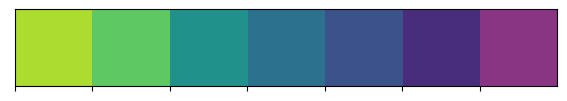

In [41]:
color_list = ['#ADDC30', '#5EC962','#21918C', '#2c728e', '#3b528b', '#472d7b', '#893584']
cmap_custom = set_color_map(color_list)

## Pub names, local authorities, addresses

In [42]:
def plot_count(data_df, feature, title, last=False):
    if last:
        order = data_df[feature].value_counts().index[-21:]
    else:
        order = data_df[feature].value_counts().index[0:20]
    f, ax = plt.subplots(1, 1, figsize=(8, 4))
    sns.countplot(x=feature, data=data_df, order = order, palette= color_list)
    plt.grid(color="black", linestyle="-.", linewidth=0.5, axis="y", which="major")
    ax.set_title(title)
    plt.xticks(rotation=90, size=8)
    plt.show()    

In [43]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

def show_wordcloud(data, mask=None, title=""):
    text = " ".join(t for t in data.drop_duplicates().dropna())
    stopwords = set(STOPWORDS)
    stopwords.update(["t", "co", "https", "amp", "U", "Comment", "text", "attr", "object"])
    wordcloud = WordCloud(stopwords=stopwords, scale=4, max_font_size=50, max_words=500,mask=mask, background_color="white",
                         colormap=cmap_custom).generate(text)
    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    fig.suptitle(title, fontsize=14)
    fig.subplots_adjust(top=2.3)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.show()    

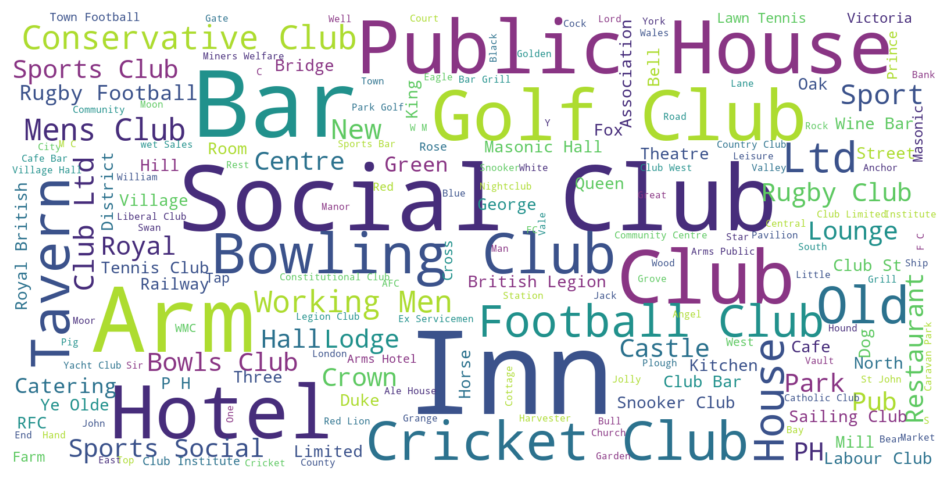

In [44]:
show_wordcloud(pub_df["name"])

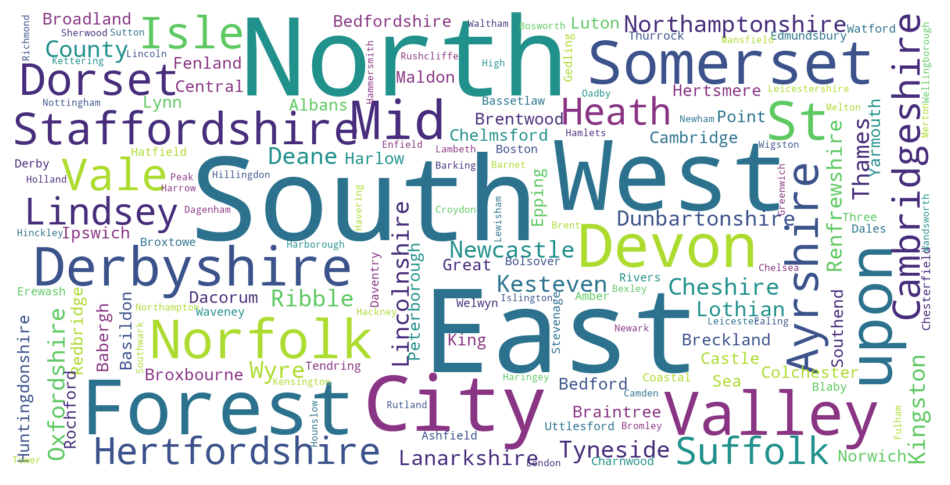

In [45]:
show_wordcloud(pub_df["local_authority"])

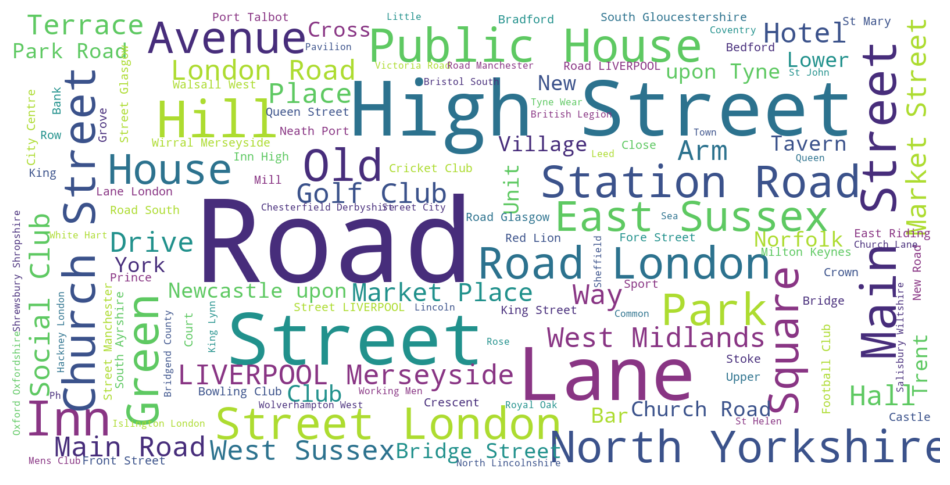

In [46]:
show_wordcloud(pub_df["address"])

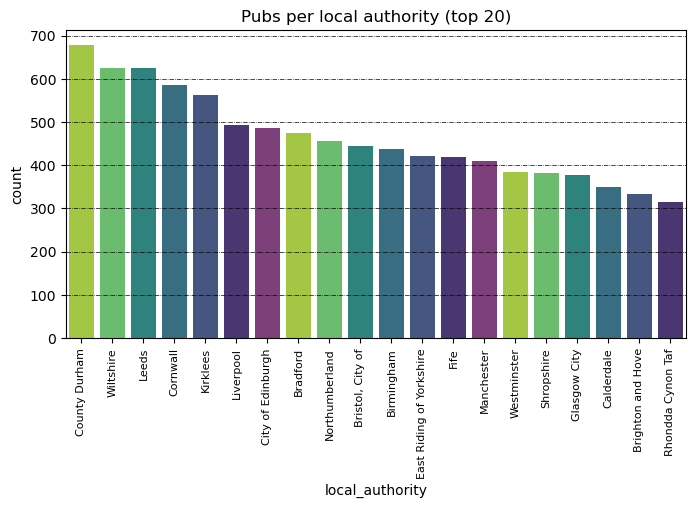

In [47]:
plot_count(pub_df, "local_authority", "Pubs per local authority (top 20)")

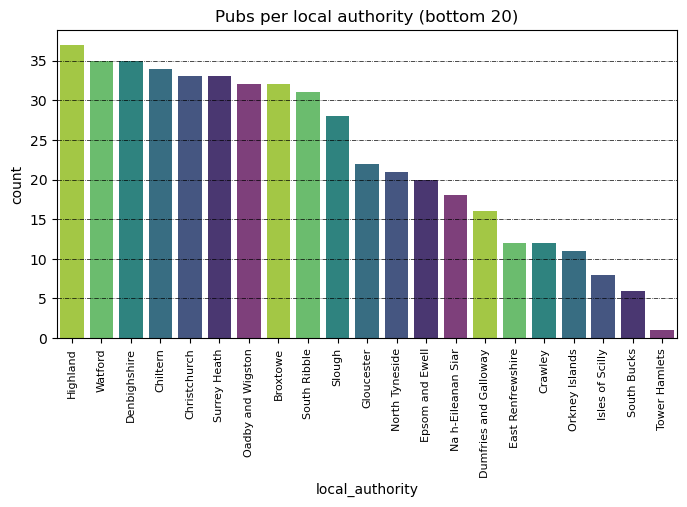

In [48]:
plot_count(pub_df, "local_authority", "Pubs per local authority (bottom 20)", True)

## Extract the county from the address

We suppose that the address contains the street, city (municipality) and the last information is the county or, in the case of large municipalities (like London), its name. Let's extract it.

In [49]:
pub_df["address_county"] = pub_df["address"].apply(lambda x: x.split(",")[-1])

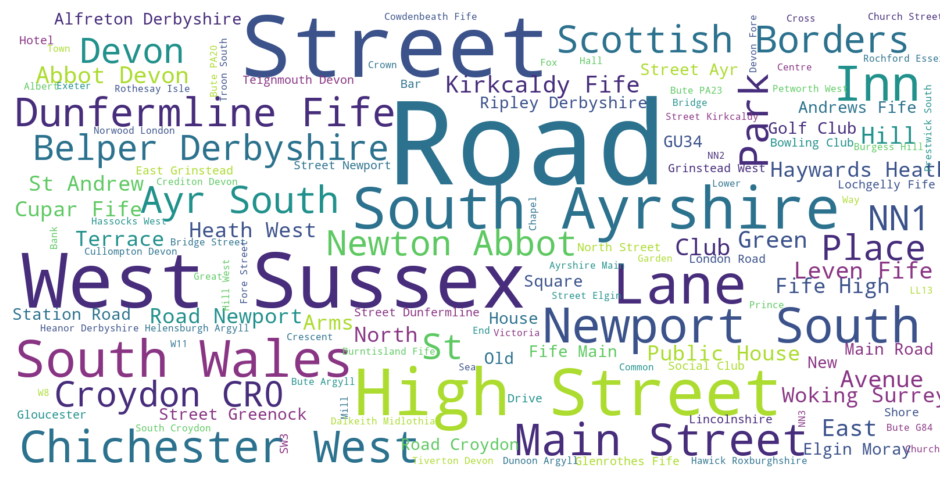

In [50]:
show_wordcloud(pub_df["address_county"])

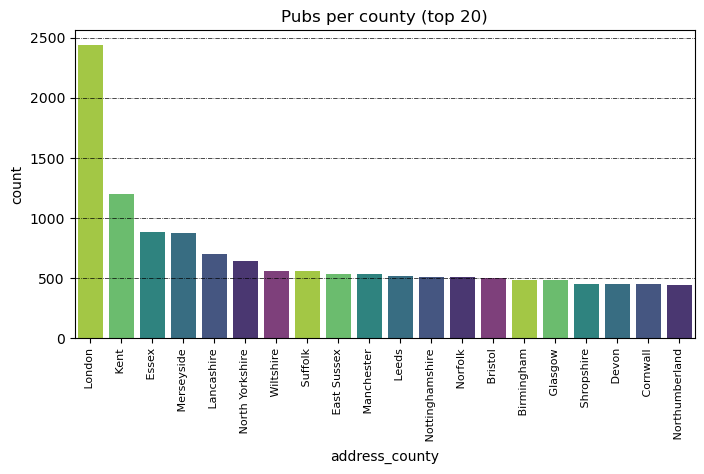

In [51]:
plot_count(pub_df, "address_county", "Pubs per county (top 20)")

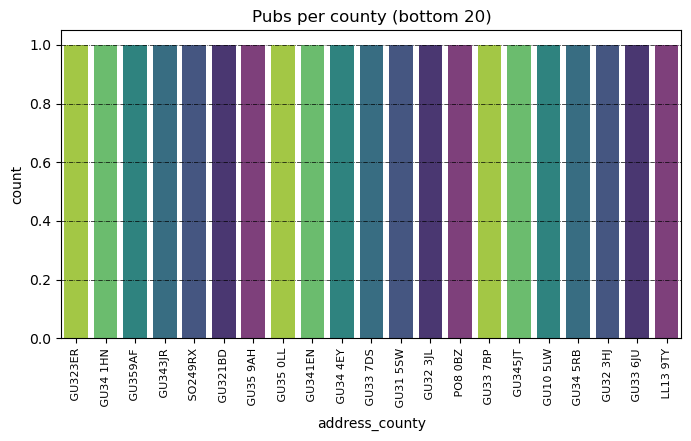

In [52]:
plot_count(pub_df, "address_county", "Pubs per county (bottom 20)", last=True)

### Extraxt the city (municipality) from the address

We apply the same hypothesis as for the counties, and we extract the city (municipality) which we presume will be just before the county. This will only apply to cases when we do have the comma present more than once.

In [53]:
def get_city(text):
    try:
        split_text = text.split(",")
        if len(split_text) > 3:
            return split_text[-2]
    except:
        return None

In [54]:
pub_df["address_city"] = pub_df["address"].apply(lambda x: get_city(x))

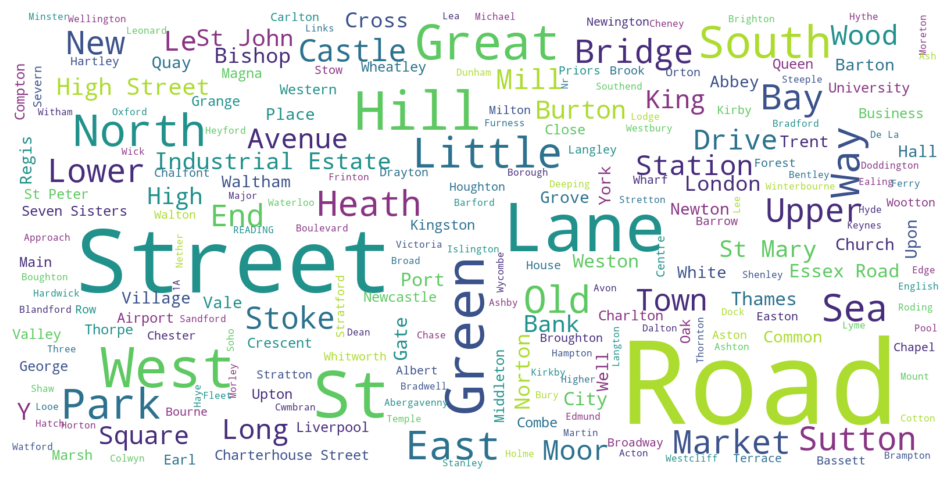

In [55]:
show_wordcloud(pub_df["address_city"])

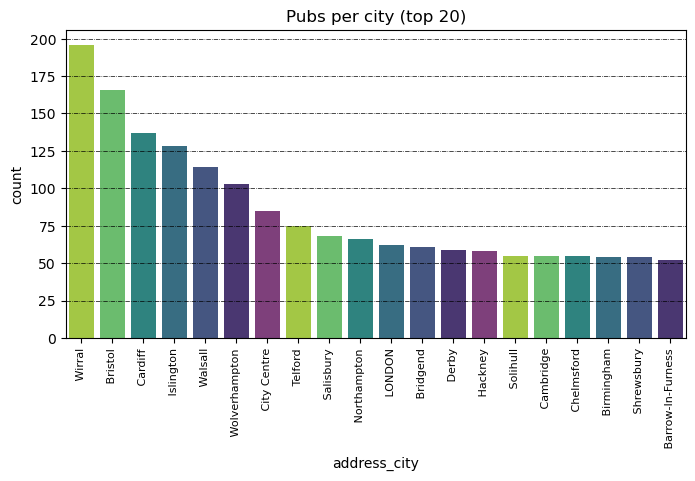

In [56]:
plot_count(pub_df, "address_city", "Pubs per city (top 20)")

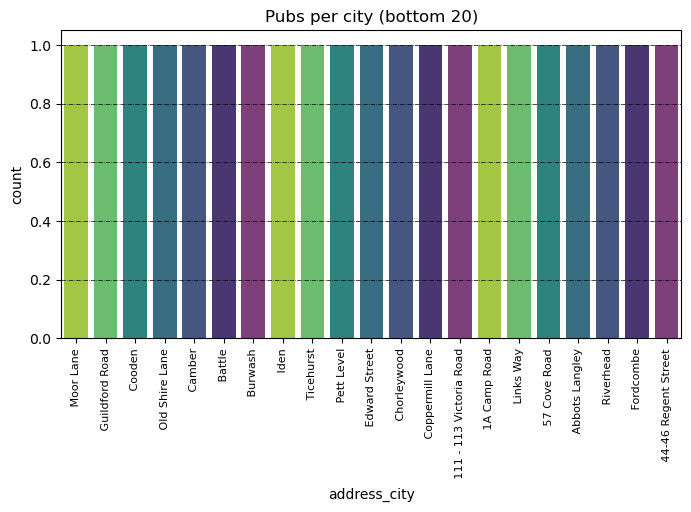

In [57]:
plot_count(pub_df, "address_city", "Pubs per city (bottom 20)", last=True)

## Geographical distribution of pub data

In [58]:
import folium
from folium.plugins import MarkerCluster, HeatMap

Let's create first a map of England (actualy, will be with UK).

In [59]:
uk_coords = [55, -3]

#Create the map
uk_map = folium.Map(location = uk_coords, zoom_start = 6)

#Display the map
uk_map

Let's now add the pub position to the map.   
Because there are too many pubs to show, we will not show all at a time, but use MarkerCluster plugin for leaflet.

In [60]:
pub_map_df = pub_df.loc[(~pub_df.latitude.isna()) & (~pub_df.longitude.isna())]

In [61]:
pub_map_df.shape

(51564, 11)

In [62]:
locations_data = np.array(pub_map_df[["latitude", "longitude"]].astype(float))

In [63]:
popups = pub_map_df.apply(lambda row: f"Name: {row['name']}\nAddress: {row['address']}\nPostcode: {row['postcode']}\nLocal authority: {row['local_authority']}", axis=1)

In [64]:
popups = np.array(popups)

In [65]:
popups = np.array(pub_map_df["name"])

In [66]:
marker_cluster = MarkerCluster(
    locations = locations_data,
)

In [67]:
marker_cluster.add_to(uk_map)
uk_map

We can also represent the pubs density using a Heatmap layer over leaflet.

In [68]:
uk_coords = [55, -3]
uk_map = folium.Map(location = uk_coords, zoom_start = 6)
HeatMap(locations_data).add_to(uk_map)
uk_map

## Voronoi polygons from pubs position

In [69]:
from scipy.spatial import Voronoi, voronoi_plot_2d

In [70]:
data_voronoi = [[x[1], x[0]] for x in locations_data]

In [71]:
pub_voronoi = Voronoi(data_voronoi)

In [72]:
len(pub_voronoi.points)

51564

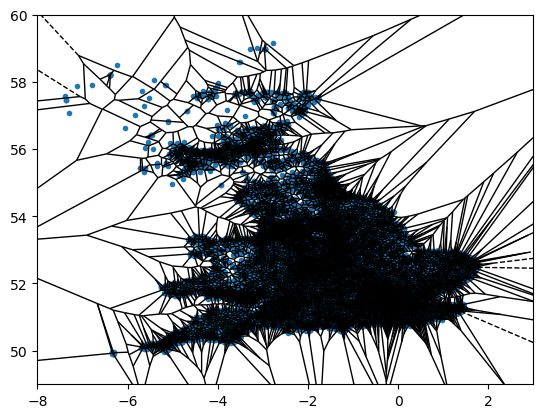

In [73]:
fig = voronoi_plot_2d(pub_voronoi,
                     show_vertices=False)
plt.xlim([-8, 3])
plt.ylim([49, 60])

plt.show()

This graph shows the polygon distribution. The Voronoi polygons were generated based on the pubs positions. We would like to extract the vertices of Voronoi polygons and keep the polygons in a separate list.

In [74]:
from shapely.geometry import Polygon, Point

In [75]:
def extract_voronoi_polygon_list(voronoi_polygons):
    voronoi_poly_list = []
    for region in voronoi_polygons.regions:
        if -1 in region:
            continue
        else:
            pass
        if len(region) != 0:
            voronoi_poly_region = Polygon(voronoi_polygons.vertices[region])
            voronoi_poly_list.append(voronoi_poly_region)
        else:
            continue
    return voronoi_poly_list

In [76]:
voronoi_poly_list = extract_voronoi_polygon_list(pub_voronoi)

In [77]:
import geopandas as gpd

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [78]:
uk_all = gpd.read_file("/kaggle/input/gadm-data-for-uk/GBR_adm0.shp")
uk_countries = gpd.read_file("/kaggle/input/gadm-data-for-uk/GBR_adm1.shp")
uk_counties = gpd.read_file("/kaggle/input/gadm-data-for-uk/GBR_adm2.shp")

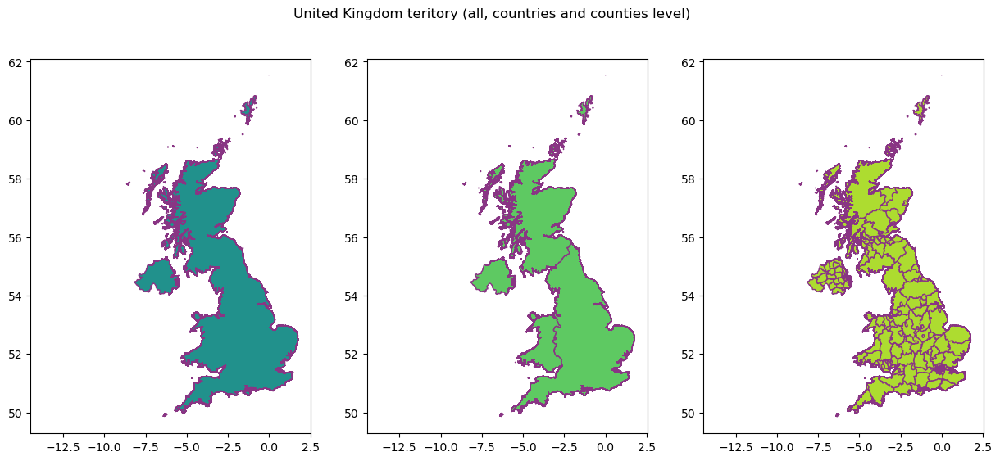

In [79]:
fig, ax = plt.subplots(1, 3, figsize = (15, 6))
uk_all.plot(ax = ax[0], color = color_list[2], edgecolor = color_list[6])
uk_countries.plot(ax = ax[1], color = color_list[1], edgecolor = color_list[6])
uk_counties.plot(ax = ax[2], color = color_list[0], edgecolor = color_list[6])
plt.suptitle("United Kingdom teritory (all, countries and counties level)")
plt.show()

We observe that whilst the shapefile for United Kingdom includes Northern Ireland (Ulser), the pubs are only in England, Wales and Scotland.  
We would like to clip Voronoi polygons from those three countries with the polygon excluding Northern Ireland.   
For this, rather than using all UK shapefile to clip pubs Voronoi polygons, we will dissolve the 3 countries shapefile in only one polygon and then we will clip using the resulted polygon.

In [80]:
uk_countries_selected = uk_countries.loc[~uk_countries.NAME_1.isin(["Northern Ireland"])]

Let's check the list if countries selected.

In [81]:
uk_countries_selected

,ID_0,ISO,NAME_0,ID_1,NAME_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry
0,242,GBR,United Kingdom,1,England,Home Nation|Constituent Country,Kingdom,None,None,"MULTIPOLYGON (((-6.38792 49.86875, -6.38792 49..."
2,242,GBR,United Kingdom,3,Scotland,Home Nation|Constituent Country,Kingdom,None,Alba,"MULTIPOLYGON (((-4.70083 54.66570, -4.70083 54..."
3,242,GBR,United Kingdom,4,Wales,Home Nation|Constituent Country,Principality,None,Cymru,"MULTIPOLYGON (((-3.10472 51.34153, -3.10472 51..."


Now we dissolve the selection. The result should be a unique polygon, with the boundary of the United Kingdom, excepting Northern Irland.

In [82]:
uk_countries_dissolved = uk_countries_selected.dissolve()

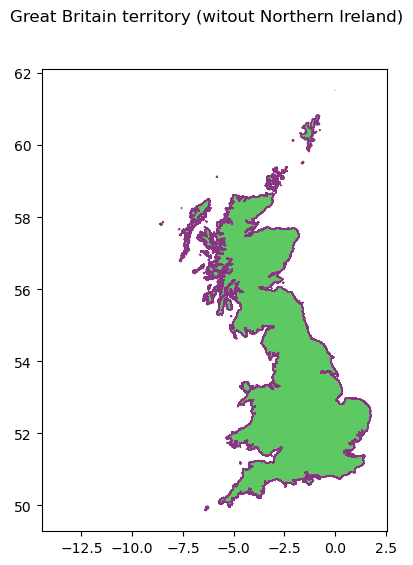

In [83]:
fig, ax = plt.subplots(1, 1, figsize = (6, 6))
uk_countries_dissolved.plot(ax = ax, color = color_list[1], edgecolor = color_list[6])
plt.suptitle("Great Britain territory (witout Northern Ireland)")
plt.show()

We transform the Voronoi polygon list in a GeoDataFrame.

In [84]:
voronoi_polygons = gpd.GeoDataFrame(voronoi_poly_list, columns = ['geometry'], crs=uk_countries_dissolved.crs)

Then, we clip the polygons in the GeoDataFrame with the Voronoi polygons using the `uk_countries_dissolved` contour polygon.  
This operation will take quite a long time.

In [85]:
start_time = time.time()
voronoi_polys_clipped = gpd.clip(voronoi_polygons, uk_countries_dissolved)
end_time = time.time()
print(f"Total time: {round(end_time - start_time, 4)} sec.")

Total time: 2135.8367 sec.


Let's check the result.

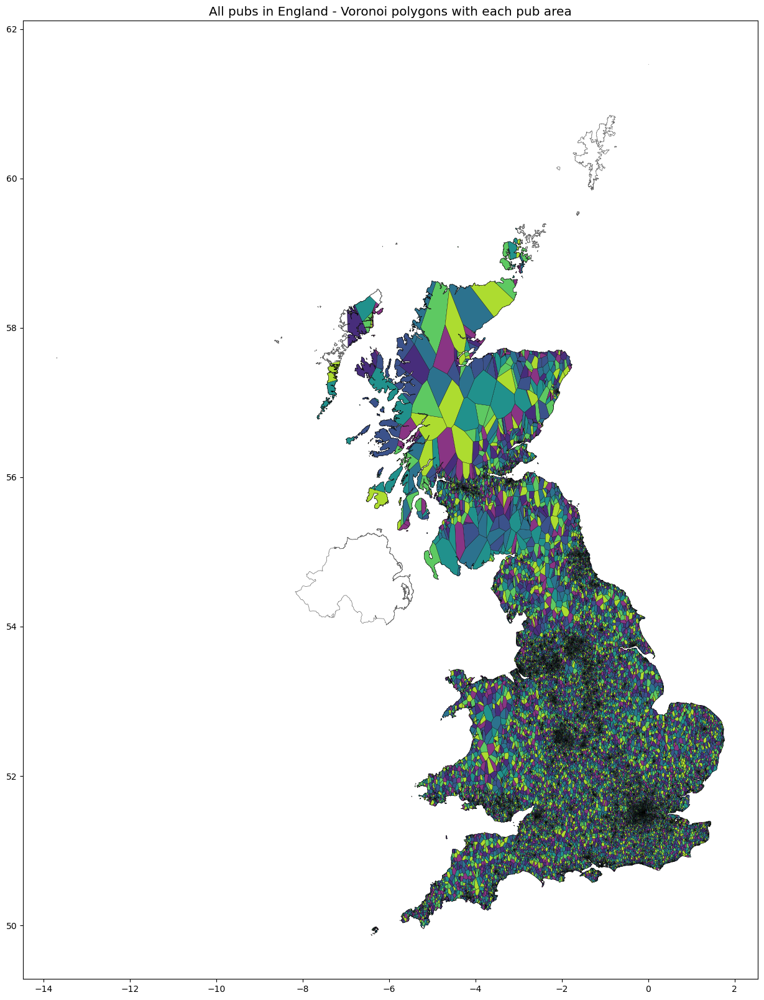

In [86]:
fig, ax = plt.subplots(1, 1, figsize = (20, 20))
plt.style.use('bmh')
uk_all.plot(ax = ax, color = 'none', edgecolor = 'dimgray')
voronoi_polys_clipped.plot(ax = ax, cmap = cmap_custom, edgecolor = 'black', linewidth = 0.25)
plt.title("All pubs in England - Voronoi polygons with each pub area")
plt.show()

## Local authority polygons with pubs density

Let's represent also counties polygons with pubs density.   
First, we aggregate pubs per local authority.   
Because the local authorities are not the same (although they are superposed in many cases) with the counties from the shapefile, we will then:  
- calculate also the lat/long avg per each local authority (from the lat/long of pubs) and asign to this point the "center" of the local authority.  
- build the Voronoi polygons associated with this distribution
- clip the resulted polygons with the UK countries selected and dissolved polygon

In [87]:
pub_df["latitude"] = pub_df["latitude"].apply(lambda x: float(x))
pub_df["longitude"] = pub_df["longitude"].apply(lambda x: float(x))

pubs_df = pub_df.groupby(["local_authority"])["name"].count().reset_index()
pubs_df.columns = ["local_authority", "pubs"]

lat_df = pub_df.groupby(["local_authority"])["latitude"].mean().reset_index()
lat_df.columns = ["local_authority", "latitude"]

long_df = pub_df.groupby(["local_authority"])["longitude"].mean().reset_index()
long_df.columns = ["local_authority", "longitude"]


pubs_df = pubs_df.merge(lat_df)
pubs_df = pubs_df.merge(long_df)
pubs_df.head()

,local_authority,pubs,latitude,longitude
0,Aberdeen City,193,57.149100,-2.118100
1,Aberdeenshire,86,57.421658,-2.307789
2,Adur,39,50.832445,-0.280745
3,Allerdale,111,54.706345,-3.335500
4,Amber Valley,179,53.037407,-1.426427


We create the Voronoi polygons and we check them.

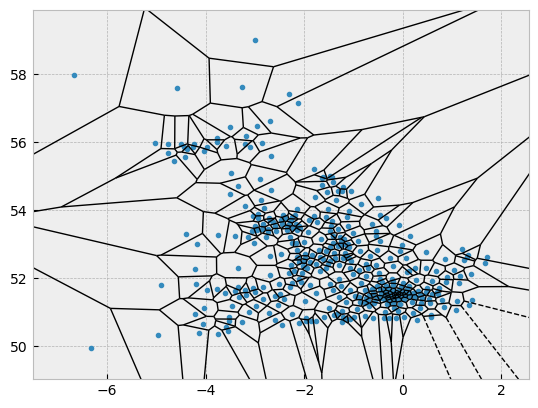

In [88]:
mean_loc_data = np.array(pubs_df[["longitude", "latitude"]].astype(float))
pub_mean_voronoi = Voronoi(mean_loc_data)
fig = voronoi_plot_2d(pub_mean_voronoi,
                     show_vertices=False)
plt.show()

We clip then the polygons using the border contours polygon.

In [89]:
mean_pub_poly_list = extract_voronoi_polygon_list(pub_mean_voronoi)
mean_voronoi_polygons = gpd.GeoDataFrame(mean_pub_poly_list, columns = ['geometry'], crs=uk_countries_dissolved.crs)
mean_voronoi_polys_clipped = gpd.clip(mean_voronoi_polygons, uk_countries_dissolved)

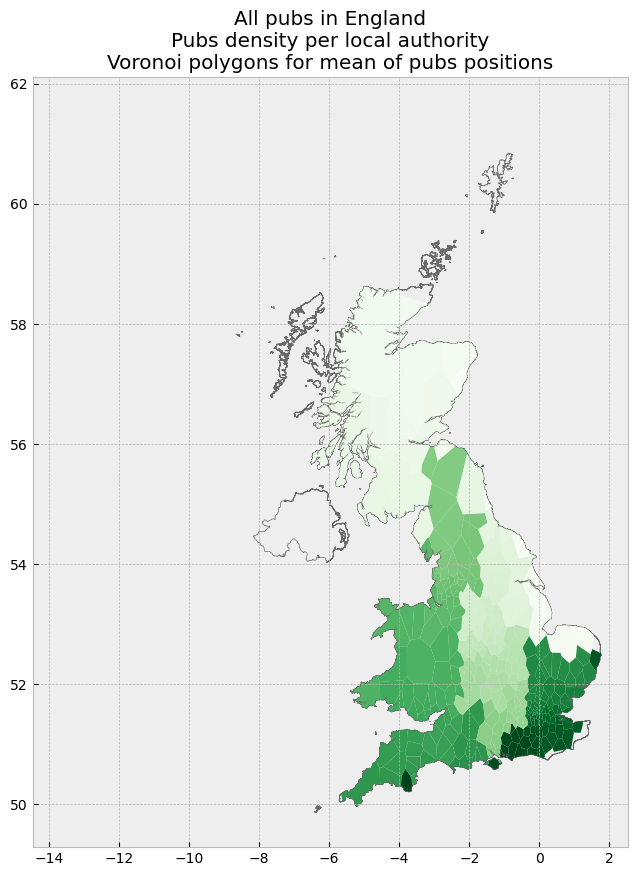

In [90]:
fig, ax = plt.subplots(1, 1, figsize = (10,10))
plt.style.use('bmh')
uk_all.plot(ax = ax, color = 'none', edgecolor = 'dimgray')
mean_voronoi_polys_clipped.plot(ax = ax, cmap = "Greens_r")
plt.title("All pubs in England\nPubs density per local authority\nVoronoi polygons for mean of pubs positions")
plt.show()